In [292]:
import numpy as nu
import scanpy as sc
import pandas as pd
from scipy.sparse import csr_matrix
import scvi

from matplotlib import pyplot as plt
from matplotlib import rcParams
%matplotlib inline

import leidenalg
import numpy.core.multiarray
from pyclustree import clustree
import gseapy as gp
from matplotlib.patches import Patch
import os
import stereo as st
import scTransform
from setuptools import setup

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backends is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


In [249]:
nu.random.seed(0)

In [250]:
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=200, facecolor='white')

scanpy==1.10.4 anndata==0.11.1 umap==0.5.3 numpy==1.26.4 scipy==1.10.1 pandas==2.0.2 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.10.4 louvain==0.8.2 pynndescent==0.5.10


/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [251]:
adata_main = sc.read("/home/jovyan/ifbdata/spatial_cell_id/Kush/data/Clarins_concatenated_adata.h5ad")

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [252]:
adata = adata_main.copy()

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [253]:
# adata = adata[(adata.obs['Publication'] != 'eyelids_full_skin') & (adata.obs['Publication'] !='photoaging_extensor_side')]

In [254]:
adata.obs['Publication']

GAACACTTCATTGCGA     multiscale_spacial_mapping
TCTCACGTCCGCACTT     multiscale_spacial_mapping
CTCCAACTCTCCTACG     multiscale_spacial_mapping
AGATGAAAGACTCGAG     multiscale_spacial_mapping
GCTACCTAGCAATAAC     multiscale_spacial_mapping
                               ...             
ACTCTAATCGGTTAAC    Dermal_sheath_outer_forearm
AGACGTTTCCGTACAA    Dermal_sheath_outer_forearm
CCGGGATCAGCAGTTT    Dermal_sheath_outer_forearm
CGGTTAACAAGTCTAC    Dermal_sheath_outer_forearm
GTAACGTTCTTTACAC    Dermal_sheath_outer_forearm
Name: Publication, Length: 783686, dtype: category
Categories (7, object): ['Dermal_sheath_outer_forearm', 'atopic_dermatitis_healthy', 'eyelids_full_skin', 'multiscale_spacial_mapping', 'multiscale_spacial_mapping_2', 'photoaging_extensor_side', 'sun_protected_human_skin_inguinoiliac']

In [255]:
adata.var_names_make_unique() #makes the gene names unique by appending a number string to each duplicate index element

In [256]:
adata.obs_names_make_unique() #makes the cell names unique by appending a number string to each duplicate index element
# alternative to reindexing part 

In [257]:
adata.var['ribo'] = adata.var_names.str.startswith(("RpS","RpL"))
adata.var['mt'] = adata.var_names.str.startswith(("Mt", "MT")) #had to include "MT" for our case

sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo', 'mt'], percent_top=None, log1p=False, inplace=True)

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


normalizing counts per cell


/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


    finished (0:00:05)


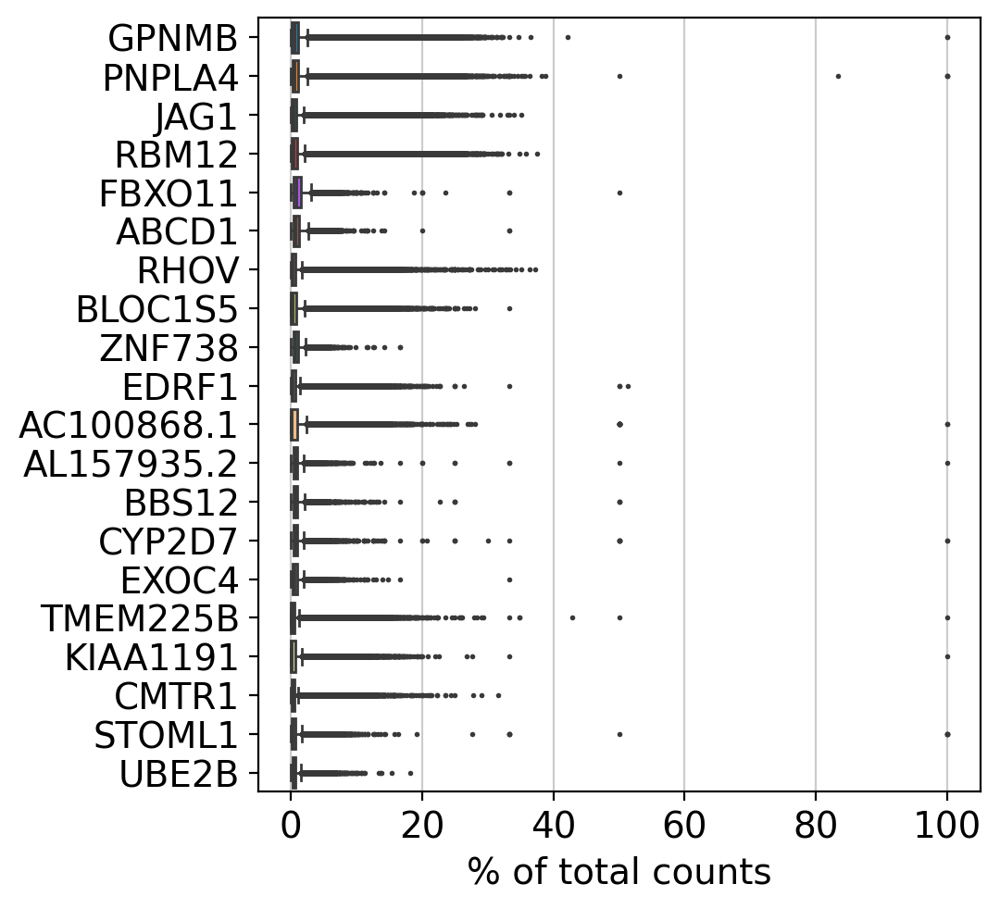

In [258]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.highest_expr_genes(adata, n_top=20)

In [259]:
print(adata.obs['Publication'].value_counts())

Publication
multiscale_spacial_mapping               277891
eyelids_full_skin                        233078
multiscale_spacial_mapping_2             187794
sun_protected_human_skin_inguinoiliac     31302
atopic_dermatitis_healthy                 27096
Dermal_sheath_outer_forearm               24589
photoaging_extensor_side                   1936
Name: count, dtype: int64


In [260]:
print(adata.obs.index[adata.obs.index.duplicated()])

Index([], dtype='object')


/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


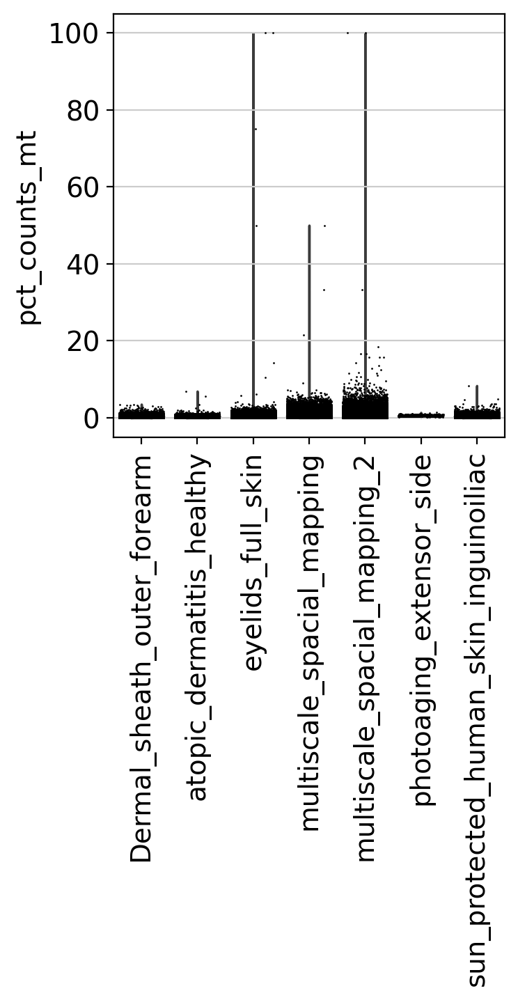

In [261]:
sc.settings.set_figure_params(dpi = 100, facecolor='white')
sc.pl.violin(adata, ['pct_counts_mt'], jitter=0.4, groupby = 'Publication', rotation= 90)
# percentage of mitochondrial gene expression 

In [262]:
adata.obs['pct_counts_mt'].max() #just to check if the percentange column was divided by 100 or not, it isn't

100.0

In [263]:
# filter the cells expressing more than 20% of mitochondrial genes (732 removed)
adata = adata[adata.obs['pct_counts_mt'] < 20, :]

print("Remaining cells %d" %adata.n_obs)

Remaining cells 782834


/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


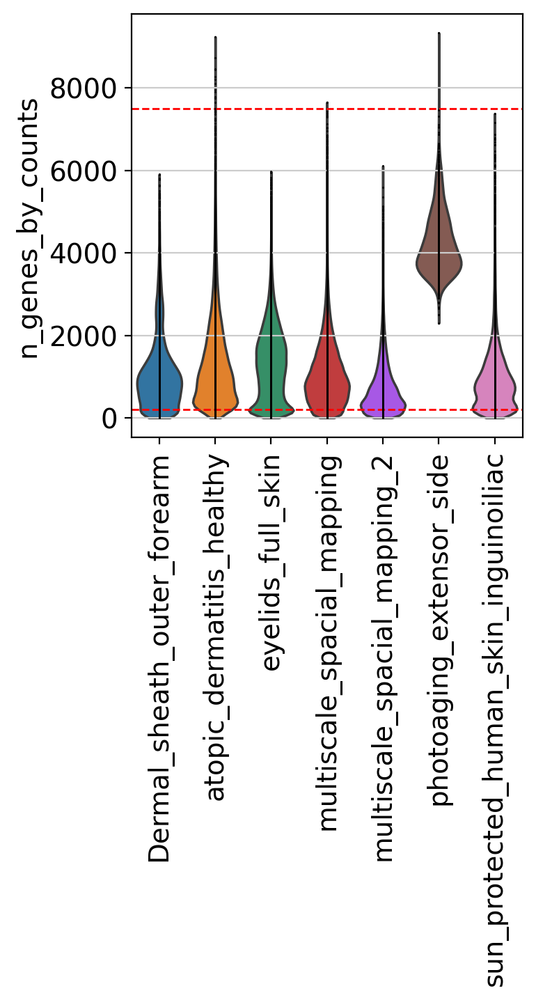

In [264]:
# visualizing the number of genes and the total counts for each publication
sc.settings.set_figure_params(dpi = 100, facecolor='white')
sc.pl.violin(adata, ['n_genes_by_counts'], jitter=0, groupby = 'Publication', rotation= 90, show=False) 
plt.axhline(y=200, color='red', linestyle='--', linewidth=1)
plt.axhline(y=7500, color='red', linestyle='--', linewidth=1)

plt.show()
# red lines show the filtering criteria set
# n_genes_by_counts = how many genes are being actively transcribed in the cell (number of genes that have non-zero expression)

#  show=False will not plot the voilin and plt.axhline will add the horizontal lines and then plt.show will print with lines

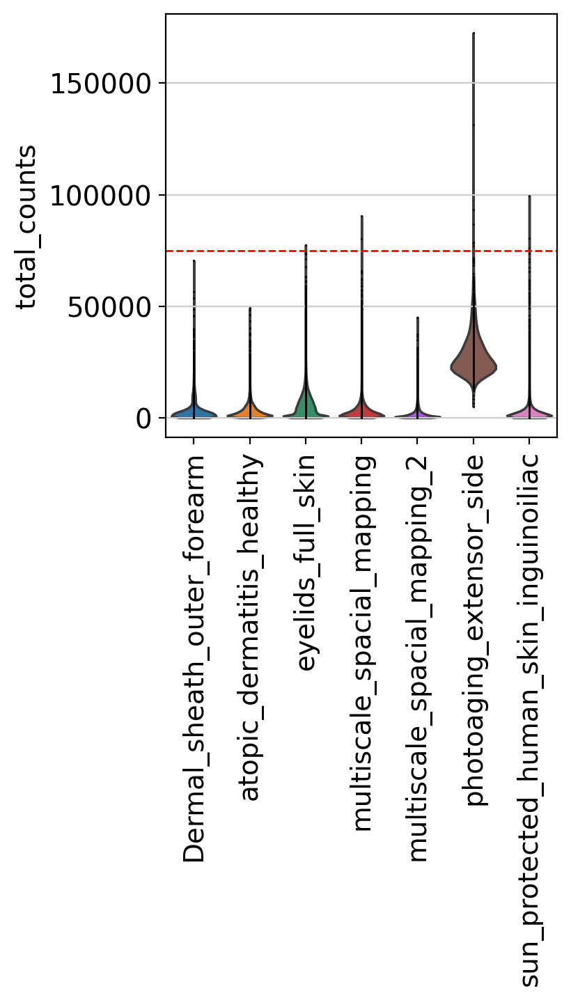

In [265]:
###### sc.settings.set_figure_params(dpi = 100, facecolor='white')
sc.pl.violin(adata, ['total_counts'], jitter=0, groupby = 'Publication', rotation= 90, show=False,)
plt.axhline(y=75000, color='red', linestyle='--', linewidth=1)
# plt.axhline(y=500, color='red', linestyle='--', linewidth=1)


plt.show()

# red lines show the filtering criteria set
# total_counts = total number of RNA counts (or reads) for a particular cell (sum of all gene expression counts for that cell)

In [266]:
adata = adata[adata.obs['n_genes_by_counts'] > 200, :]
print("Remaining cells %d" %adata.n_obs)

Remaining cells 693323


In [267]:
adata = adata[adata.obs['n_genes_by_counts'] < 7500, :]
print("Remaining cells %d" %adata.n_obs)

Remaining cells 693306


In [268]:
# adata = adata[adata.obs['total_counts'] > 500, :]
# print("Remaining cells %d" %adata.n_obs)

In [269]:
adata = adata[adata.obs['total_counts'] < 75000, :]
print("Remaining cells %d" %adata.n_obs)

Remaining cells 693294


/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


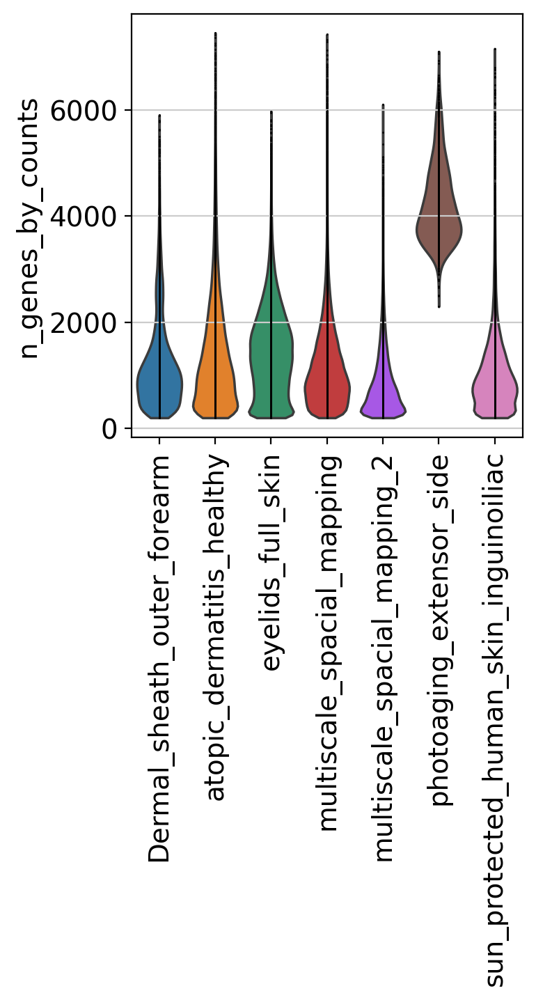

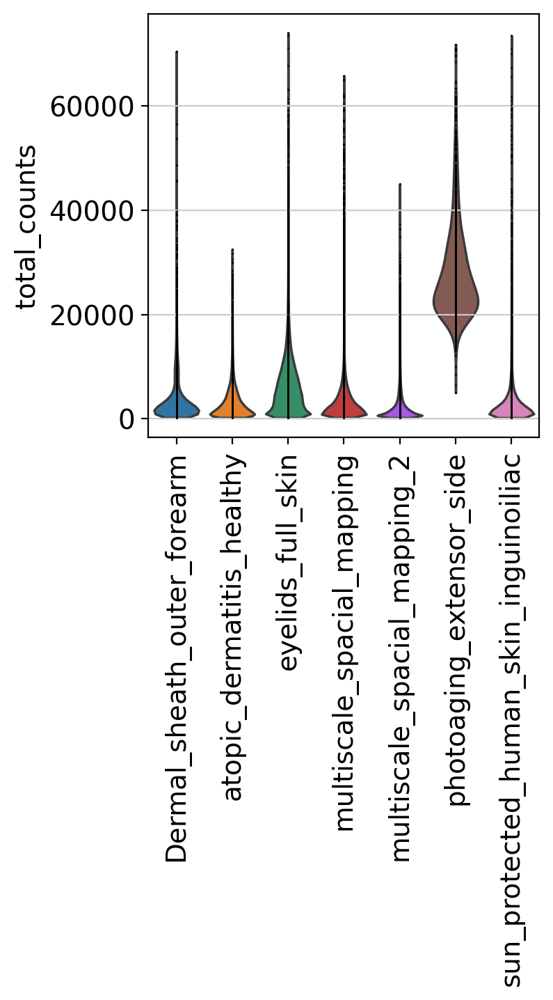

In [270]:
# now after the filteration
# setting the jitter to 0 to visualize violins due to high number of genes
sc.settings.set_figure_params(dpi = 100, facecolor='white')
sc.pl.violin(adata, ['n_genes_by_counts'], jitter=0, groupby = 'Publication', rotation= 90)
sc.pl.violin(adata, ['total_counts'], jitter=0, groupby = 'Publication', rotation= 90)

In [271]:
# setting filter of minimum genes expressed = 200
sc.pp.filter_cells(adata, min_genes=200)
print(f"Remaining cells: {adata.n_obs}")

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:168: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Remaining cells: 693294


In [272]:
# setting filter of gene minimum expressed in 3 cells to be included
sc.pp.filter_genes(adata, min_cells=3)
print(f"Remaining genes: {adata.n_vars}") 

filtered out 894 genes that are detected in less than 3 cells
Remaining genes: 19222


In [273]:
adata2 = adata.copy() #this is the filtered adata

In [274]:
adata2

AnnData object with n_obs × n_vars = 693294 × 19222
    obs: 'Dataset', 'Age', 'Sex', 'Skin area', 'Ethnicity', 'Publication', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'ribo', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'Publication_colors'

In [275]:
# exporting the fitered adata for easy further access
adata2.write("/home/jovyan/ifbdata/spatial_cell_id/Kush/Scanpy_analysis/New_analysis/adata_filtered_scvi.h5ad")

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/h5py/_hl/attrs.py:104: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  self.create(name, data=value)
/opt/conda/envs/spatialdata/lib/python3.10/site-packages/h5py/_hl/attrs.py:104: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  self.create(name, data=value)
/opt/conda/envs/spatialdata/lib/python3.10/site-packages/h5py/_hl/attrs.py:104: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  self.create(name, data=value)
/opt/conda/envs/spatialdata/lib/python3.10/site-packages/h5py/_hl/attrs.py:104: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  self.create(name, data=value)
/opt/conda/envs/spatialdata/lib/python3.10/site-pack

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


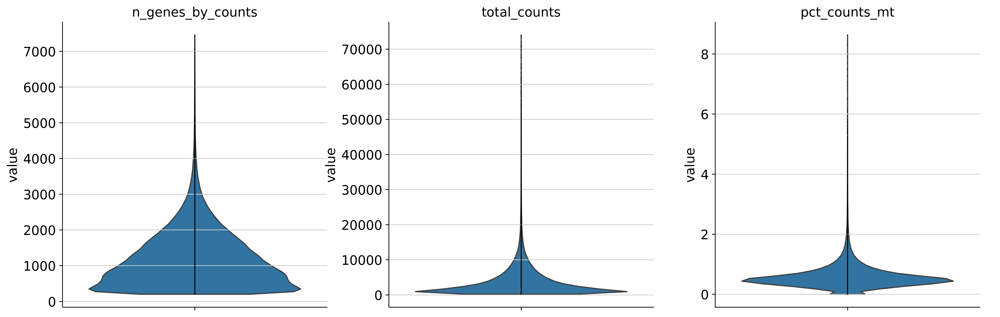

In [276]:
sc.settings.set_figure_params(dpi = 300, facecolor='white')
sc.pl.violin(adata2, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0, multi_panel=True) #need to adjust jitter for non-cluttered plots.

/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


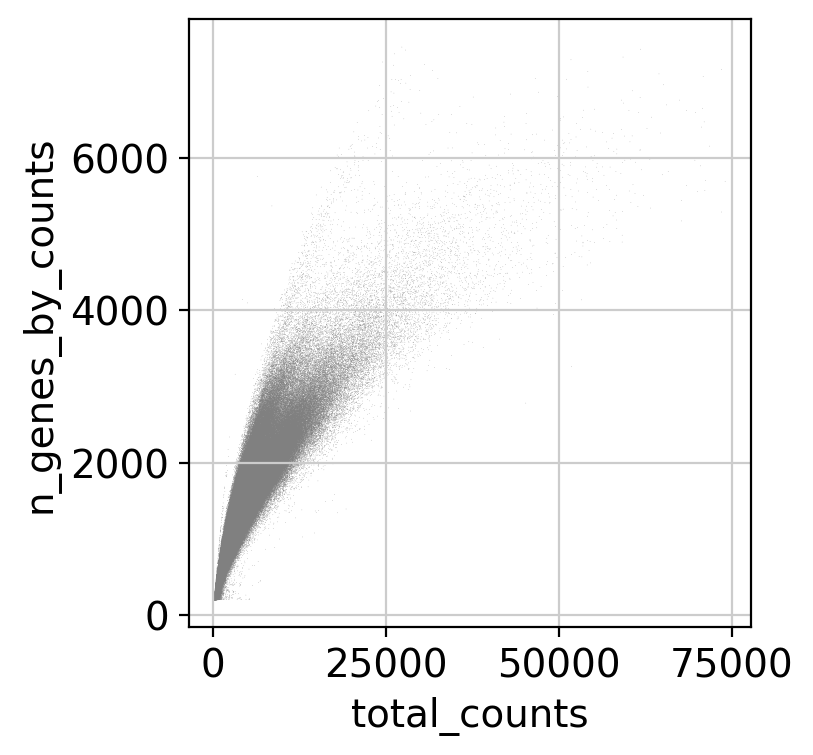

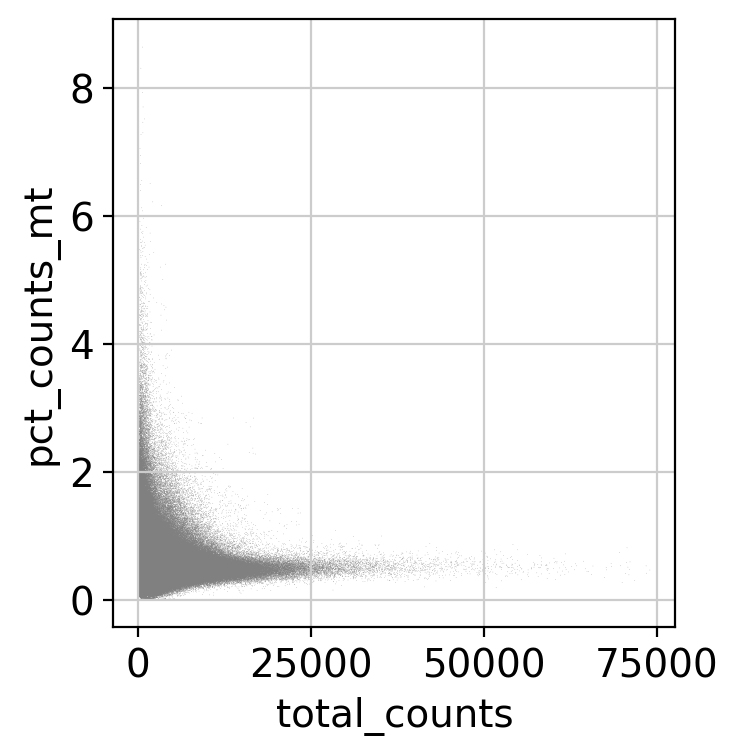

In [277]:
sc.settings.set_figure_params(dpi = 100, facecolor='white')
sc.pl.scatter(adata2, x='total_counts', y='n_genes_by_counts')
sc.pl.scatter(adata2, x="total_counts", y="pct_counts_mt")

In [278]:
# normalization to total genes per cell
# accounts for sequencing depth 
# sc.pp.normalize_total(adata2,exclude_highly_expressed=True)
# adata2.X = adata2.X.toarray()  # Convert to dense if it's sparse
adata2.layers["counts"] = adata2.X.copy()  # preserve counts
sc.pp.normalize_total(adata2, target_sum=1e4)

normalizing counts per cell
    finished (0:00:03)


In [279]:
# log transformation 
# accounts for skewness between high and low expression and makes data suitable for dimensionality reduction
sc.pp.log1p(adata2)
adata2.raw = adata2  # freeze the state in `.raw`

In [283]:
# with all default values (min_mean=0.0125, max_mean=3, min_disp=0.5)
# adds 4 columns to adata.var
# highly expressed genes have higher variance 
# sc.pp.highly_variable_genes(adata2)
sc.pp.highly_variable_genes(
    adata2,
    n_top_genes=3000,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="Dataset",
)

extracting highly variable genes


/opt/conda/envs/spatialdata/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [293]:
scvi.model.SCVI.setup_anndata(
    adata2,
    layer="counts",
    categorical_covariate_keys=["Dataset"],
    continuous_covariate_keys=['pct_counts_mt', 'pct_counts_ribo'],
)

AttributeError: module 'scvi' has no attribute 'model'

In [297]:
import scvi; print(scvi.__version__)

0.6.8


In [282]:
adata

AnnData object with n_obs × n_vars = 693294 × 19222
    obs: 'Dataset', 'Age', 'Sex', 'Skin area', 'Ethnicity', 'Publication', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'ribo', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'Publication_colors'

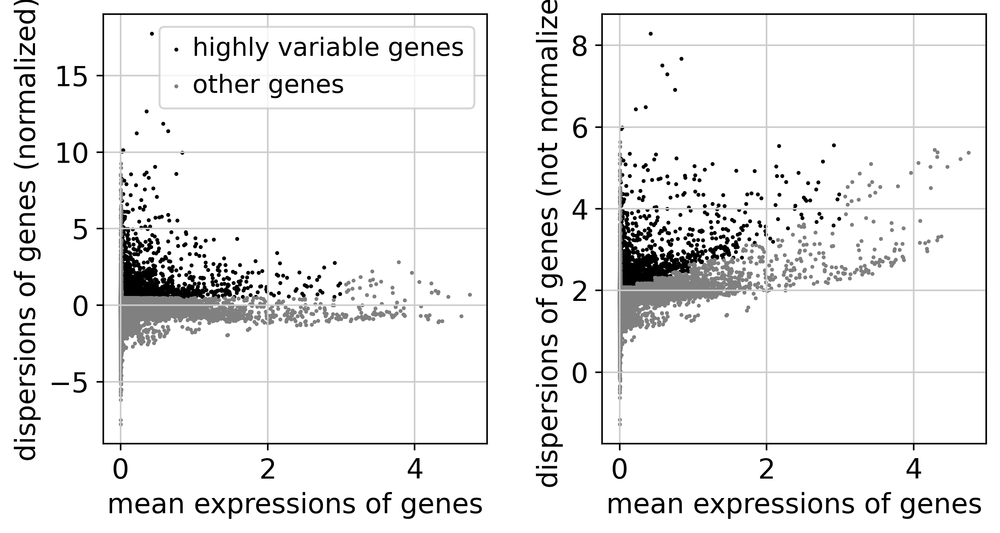

In [108]:
sc.pl.highly_variable_genes(adata2)

In [127]:
adata2.obs["n_counts"] = adata2.X.sum(axis=1)  # Sum of counts per cell
print(adata2.obs["n_counts"].describe())  # Check if values are around 10,000

count    429122.000000
mean       2003.273193
std         560.625305
min         247.035614
25%        1570.927948
50%        1968.199524
75%        2395.110657
max        4452.367188
Name: n_counts, dtype: float64


In [126]:
sc.pp.calculate_qc_metrics(adata2,qc_vars="CLDN5")

KeyError: 'CLDN5'

In [95]:
# storing the current unscaled data in the raw attribute for further comparison
adata2.raw = adata2
#and can access by calling:
# adata_from_raw = adata.raw.to_adata()

In [166]:
#scaling each gene to unit variance and trimming off values exceeding standard daviation 10.
sc.pp.scale(adata2, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [167]:
sc.tl.pca(adata2, svd_solver='arpack', random_state=7) #keeping random_state constant for future reproductibity

#svd_solver is to choose which SVD(singular value decomposition, for dimentionality reduction)
# "arpack" is default, takes time but gives high precision

computing PCA
    with n_comps=50
    finished (0:02:00)


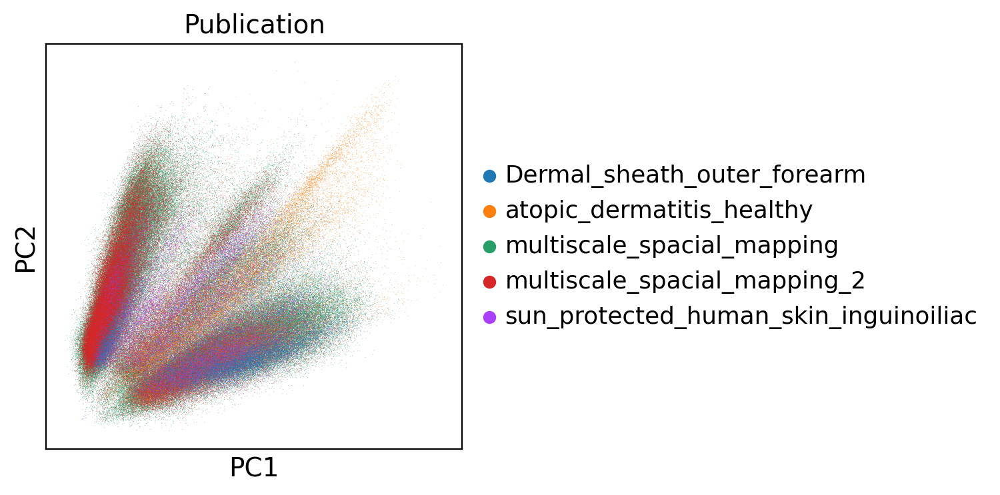

In [168]:
sc.settings.set_figure_params(dpi = 100, facecolor='white')
sc.pl.pca(adata2, color='Publication')

In [169]:
sc.pp.neighbors(adata2, n_neighbors=10, n_pcs=40, random_state=7)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:46)


In [170]:
sc.tl.umap(adata2, random_state=7)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:03:54)


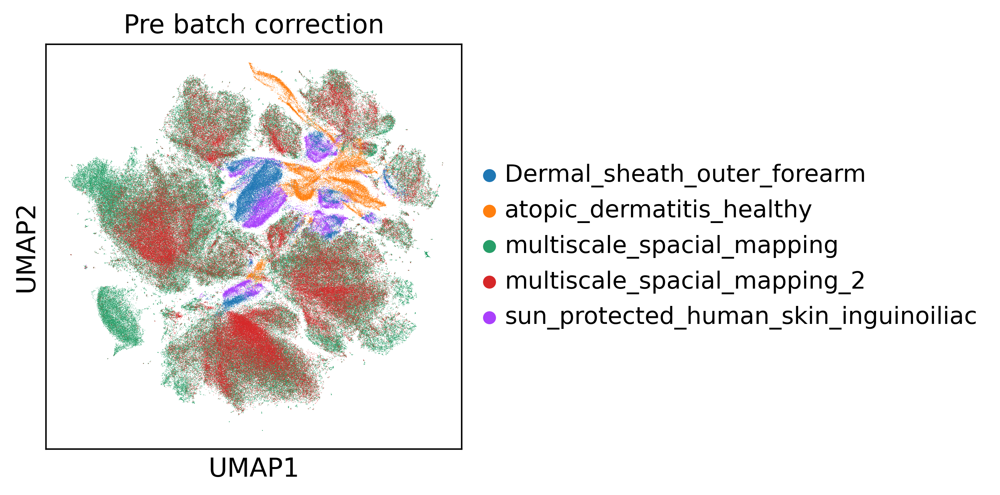

In [171]:
sc.settings.set_figure_params(dpi = 200, facecolor='white')
sc.pl.umap(adata2, color='Publication', title = "Pre batch correction")

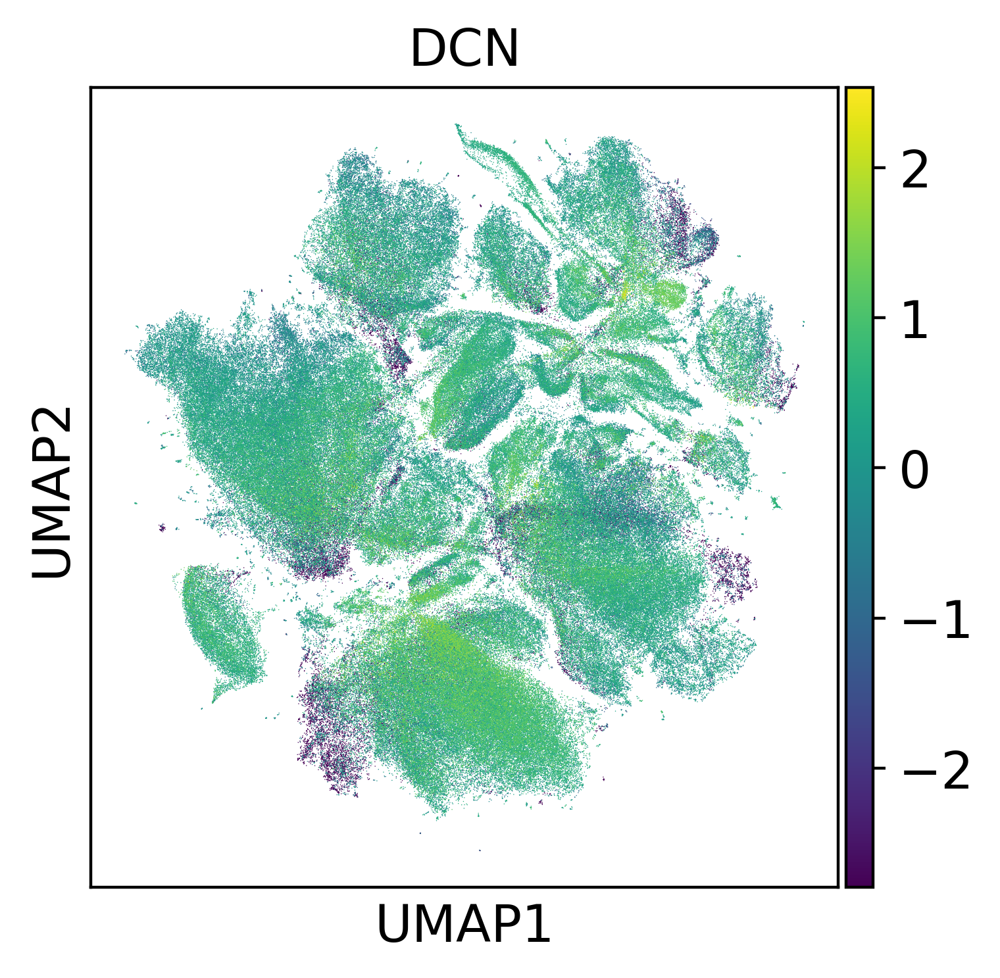

In [172]:
sc.settings.set_figure_params(dpi = 200, facecolor='white')
sc.pl.umap(adata2, color='DCN')

In [63]:
adata2.write('/home/jovyan/ifbdata/spatial_cell_id/Kush/Scanpy_analysis/New_analysis/adata_pre_batch_effect.h5ad')

In [173]:
adata3 = adata2.raw.to_adata()

AttributeError: 'NoneType' object has no attribute 'to_adata'

In [65]:
adata3.uns['log1p']['base']=None

In [66]:
sc.pp.highly_variable_genes(adata3, batch_key = 'Publication')

extracting highly variable genes
    finished (0:00:14)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [67]:
var_select = adata3.var.highly_variable_nbatches > 2
var_genes = var_select.index[var_select]
len(var_genes)

1235

BBKNN

In [174]:
sc.external.pp.bbknn(adata2, batch_key='Publication', n_pcs=30)
sc.tl.umap(adata2, random_state=7)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:46)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:04:18)


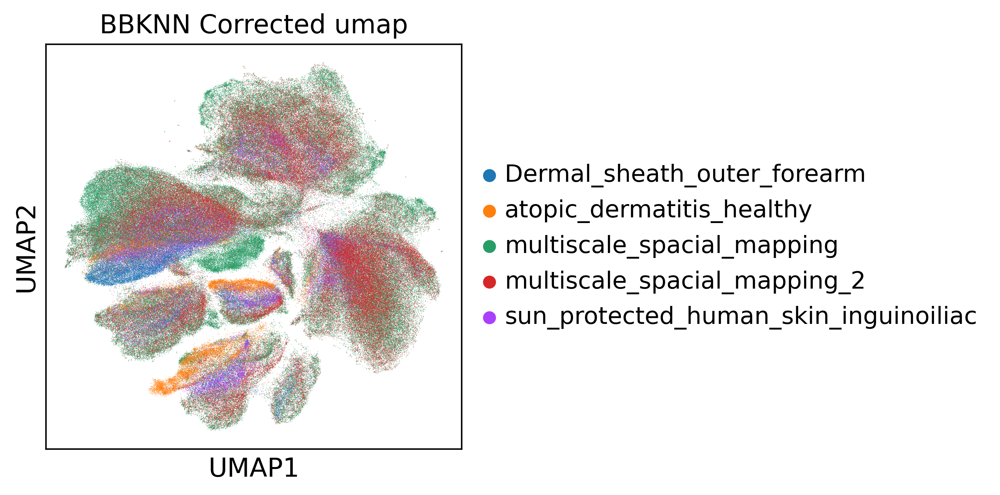

In [176]:
sc.settings.set_figure_params(dpi = 200, facecolor='white')
sc.pl.umap(adata2, color="Publication", title="BBKNN Corrected umap")

In [70]:
adata3.write('/home/jovyan/ifbdata/spatial_cell_id/Kush/Scanpy_analysis/New_analysis/adata_bbknn_adjusted.h5ad')

In [71]:
sc.pp.highly_variable_genes(adata3, n_top_genes=3000, flavor="cell_ranger", batch_key='Publication')

extracting highly variable genes
    finished (0:00:12)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [72]:
HVG = [i for i in adata3.var.loc[adata3.var['highly_variable'] == True].index] 

In [73]:
HVG_shared = [i for i in adata3.var.loc[HVG].loc[adata3.var.loc[HVG]['highly_variable_intersection'] == True].index]

highly_variable_nbatches
0    12084
1     3362
2     1444
3      811
5      721
4      678
Name: count, dtype: int64

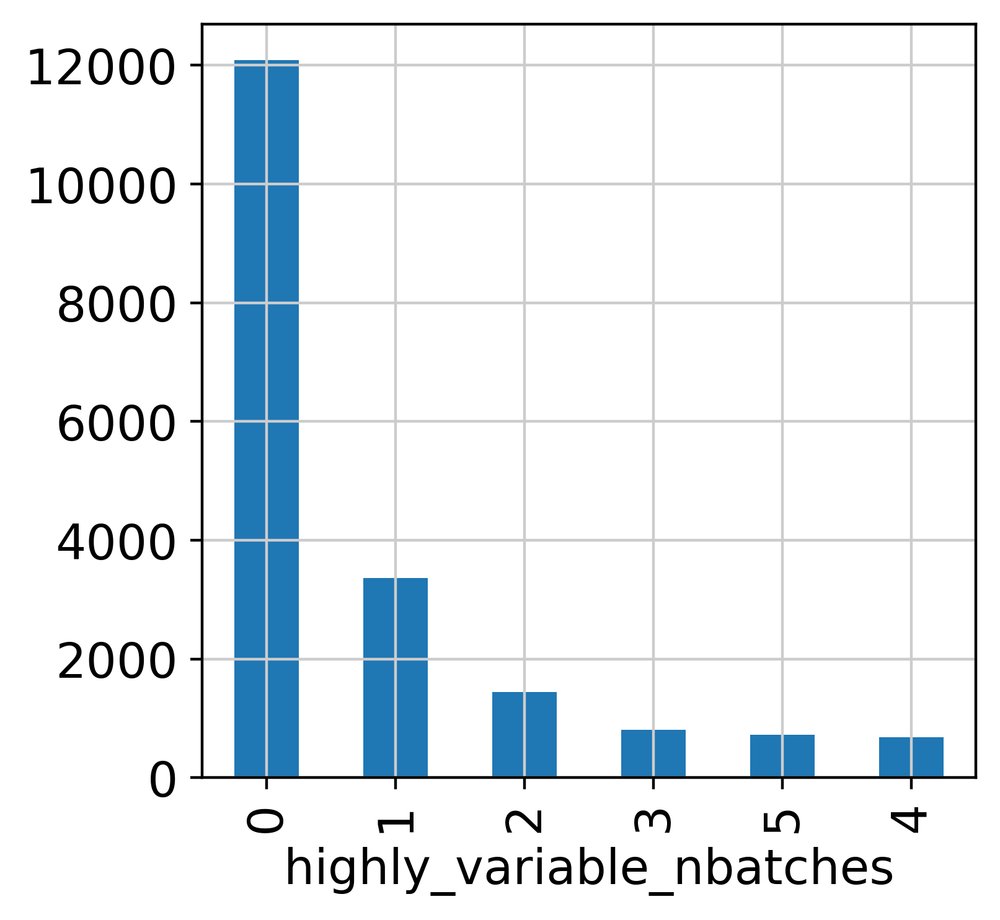

In [74]:
n_batches = adata3.var["highly_variable_nbatches"].value_counts()
ax = n_batches.plot(kind="bar")
n_batches

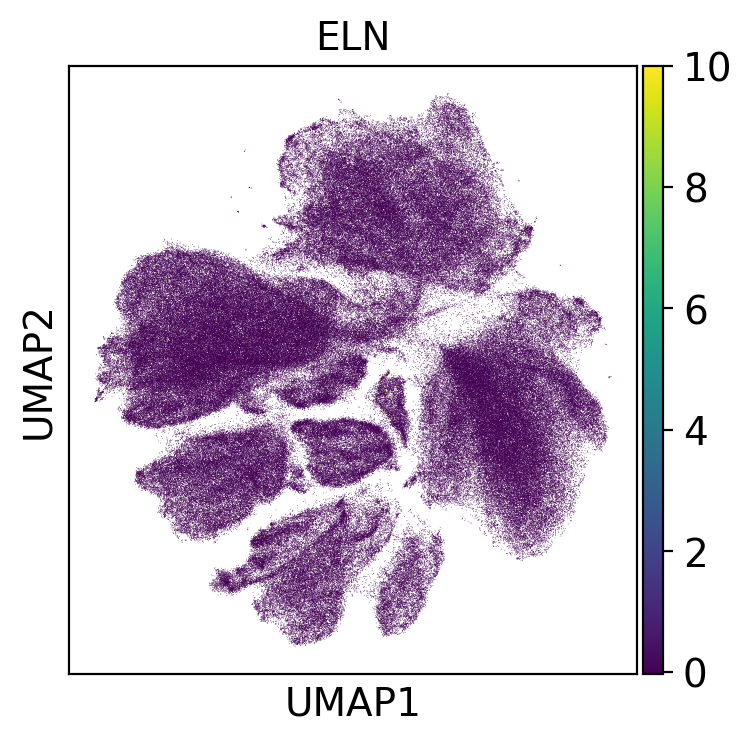

In [189]:
gene = "ELN"
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata2, color=f'{gene}', title=f'{gene}')

In [161]:
# just after copying adata2 from adata filtered
adata_sct = scTransform.vst(adata2, umi, latent_var=['log_umi'], cell_attr)

SyntaxError: positional argument follows keyword argument (2163665722.py, line 2)

In [162]:
sc.pp.normalize_per_cell(adata2, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:03): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)
